In [4]:
!pip install reservoirpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 4.6 MB/s eta 0:00:00


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
from math import comb

In [2]:
#constants

number_of_features = 3
reservoir_dim = 300
edge_creation_prob = 0.1
spectral_radius = 1.2

train_test_split_ratio = 0.9
n_timesteps = 5000

sigma, rho, beta, h = 10, 28, 8/3, 0.02

In [5]:
from reservoirpy.datasets import lorenz

def dataset(n_timesteps):
    training_split = train_test_split_ratio
    n_timesteps = n_timesteps
    data = lorenz(n_timesteps=n_timesteps, sigma=sigma, rho=rho, beta=beta, h=h)
    training_data = np.array(data[:int(n_timesteps*training_split)])
    testing_data = np.array(data[int(n_timesteps*training_split):])

    return data, training_data, testing_data

data, training_data, testing_data = dataset(n_timesteps=n_timesteps)

In [6]:
def create_system(output_dim, reservoir_dim, spectral_radius, edge_creation_prob, seed, graph_type, random_edge_probability):

  reservoir = np.zeros(reservoir_dim)
  reservoir_input = (np.random.rand(reservoir_dim, output_dim) - .5) * edge_creation_prob

  if graph_type == 'default':
    if not random_edge_probability:
      graph = nx.gnp_random_graph(reservoir_dim, edge_creation_prob, seed)
    else:

      graph = nx.Graph()
      for i in range(reservoir_dim):
        graph.add_node(i)

      i = 0
      num_edges_prob = comb(reservoir_dim, 2) * 0.5
      while True:
        if i >= num_edges_prob:
          break
        node1 = np.random.randint(0, reservoir_dim)
        node2 = np.random.randint(0, reservoir_dim)
        while node2 == node1:
          node2 = np.random.randint(0, reservoir_dim)
        if node1 not in graph[node2]:
          probability = np.random.uniform(0, 1)
          val = np.random.randint(0, 1000000000)
          if val < probability * 1000000000:
            graph.add_edge(node1, node2)
            graph.add_edge(node2, node1)
            i += 1

  elif graph_type == 'complete':
    graph = nx.complete_graph(reservoir_dim)

  elif graph_type == 'tree':
    graph = nx.random_powerlaw_tree(reservoir_dim, seed=seed, tries=reservoir_dim* 1000)

  graph = nx.to_numpy_array(graph)

  rand_mat = 2 * (np.random.rand(reservoir_dim, reservoir_dim) - 0.5)
  scale_mat = graph * rand_mat
  ev = np.linalg.eig(scale_mat)[0]
  max_ev = np.max(ev)
  rescale_mat = scale_mat/np.absolute(max_ev) * spectral_radius

  return rescale_mat, reservoir, reservoir_input


def fit(data, output_dim, reservoir_dim, reservoir, adj, reservoir_input):

  reservoir_output = np.zeros((output_dim, reservoir_dim))
  state_matrix = np.zeros((reservoir_dim, data.shape[0]))

  for time_step in range(data.shape[0]):
      np.put(state_matrix[:, time_step], range(len(state_matrix)), reservoir)
      x = np.dot(adj, reservoir) + np.dot(reservoir_input, data[time_step])

      reservoir = np.tanh(x)

  transposed_matrix = np.transpose(state_matrix)
  identity_matrix = 0.0001 * np.identity(state_matrix.shape[0])
  inverse_part = np.linalg.solve(np.dot(state_matrix, transposed_matrix) + identity_matrix, np.eye(state_matrix.shape[0]))
  reservoir_output = np.dot(np.dot(data.T, transposed_matrix), inverse_part)

  return reservoir, reservoir_output

def forecast(future_data, output_dim, reservoir, adj, reservoir_input, reservoir_output):
  pred = np.zeros((future_data, output_dim))
  for time_step in range(future_data):
      pred[time_step] = np.dot(reservoir_output, reservoir)
      x = np.dot(adj, reservoir) + np.dot(reservoir_input, pred[time_step])
      reservoir = np.tanh(x)
  return pred

In [7]:
def create_fit_forecast(output_dim, reservoir_dim, scaler, edge_creation_prob, seed, graph_type="default",
                        random_edge_probability=False, data=None, future_data=None):

  adj, reservoir, reservoir_input = create_system(output_dim, reservoir_dim, scaler, edge_creation_prob, seed, graph_type, random_edge_probability)

  if data is None: return adj, reservoir, reservoir_input
  else: reservoir, reservoir_output = fit(data, output_dim, reservoir_dim, reservoir, adj, reservoir_input)

  if future_data is None: return adj, reservoir, reservoir_input, reservoir_output
  else: preds = forecast(future_data, output_dim, reservoir, adj, reservoir_input, reservoir_output)

  return preds

In [8]:
def average_forecast_horizon(preds, actual):
  s = np.std(actual)
  x, y, z = 0, 0, 0
  for i, vals in enumerate(preds):
    x += (preds[i][0] - actual[i][0]) < s
    y += (preds[i][1] - actual[i][1]) < s
    z += (preds[i][2] - actual[i][2]) < s
  return x/len(preds), y/len(preds), z/len(preds)

def plot_graphs(test, pred, title=None):
  fig, ax = plt.subplots(3, 1, figsize=(9, 9))

  t = [i for i in range(int(n_timesteps*train_test_split_ratio), n_timesteps)]
  temp = ['X', 'Y', 'Z']
  color_table = ['red', 'green', 'blue']
  if title:
    ax[0].set_title(title+'\n')
  for i in range(3):
    if i == 0:
      new_title = title + '\n' + "Predicted Lorenz " + temp[i] + " Data and Actual Lorenz " + temp[i] + " Data"
    else:
      new_title = "Predicted Lorenz " + temp[i] + " Data and Actual Lorenz " + temp[i] + " Data"
    ax[i].set_title(new_title)
    ax[i].set_xlabel("timestep")
    ax[i].plot(t, test[:, i], label=temp[i], color=color_table[i])
    ax[i].plot(t, pred[:, i], label=temp[i]+"_pred")
    ax[i].legend()

  fig.tight_layout()

  plt.show()

## Individual Models

Default Reservoir Forecast Horizons of X, Y, and Z:  (0.918, 0.916, 0.904)


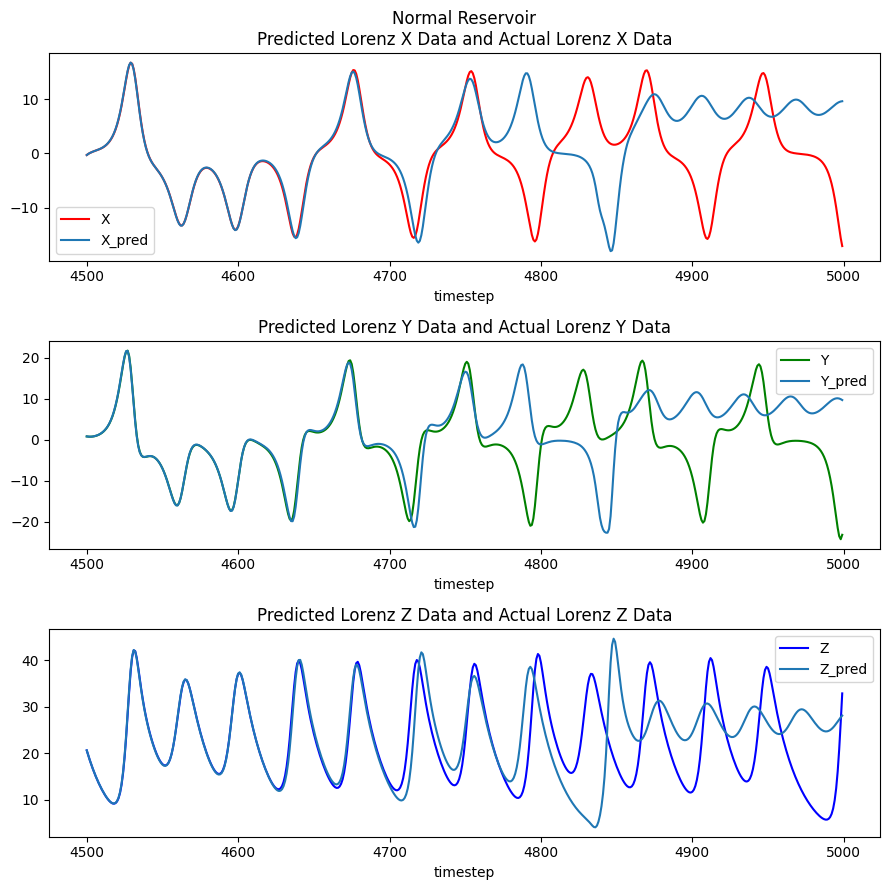

In [9]:
predicted_data = create_fit_forecast(output_dim=3, reservoir_dim=300, scaler=1.2,
                                     edge_creation_prob=0.1, graph_type='default', seed=52, data=training_data, future_data=len(testing_data))

print("Default Reservoir Forecast Horizons of X, Y, and Z: ", average_forecast_horizon(predicted_data, testing_data))

plot_graphs(testing_data, predicted_data, title='Normal Reservoir')

### ESN

In [10]:
from reservoirpy.nodes import Reservoir, Ridge

reservoir = Reservoir(reservoir_dim, lr=0.5, sr=0.9)
ridge = Ridge(output_dim=3, ridge=1e-7)

esn_model = reservoir >> ridge

In [11]:
# ECHO STATE NETWORK USING LIBRARY

X_train = training_data[:-1]
X_test = training_data[1:] + [[0, 0, 0]]
print(len(X_train))
print(len(X_test))
print(X_test[0])
esn_model = esn_model.fit(X_train, X_test)
predicted_data = esn_model.run(testing_data)

4499
4499
[1.04876652 1.52420399 0.97311353]


Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 174it [00:00, 1739.88it/s]           
Running Model-0: 348it [00:00, 1630.31it/s]
Running Model-0: 542it [00:00, 1765.50it/s]
Running Model-0: 720it [00:00, 1682.30it/s]
Running Model-0: 890it [00:00, 1628.68it/s]
Running Model-0: 1054it [00:00, 1625.39it/s]
Running Model-0: 1245it [00:00, 1714.57it/s]
Running Model-0: 1440it [00:00, 1786.46it/s]
Running Model-0: 1685it [00:00, 1985.83it/s]
Running Model-0: 1885it [00:01, 1879.51it/s]
Running Model-0: 2087it [00:01, 1919.60it/s]
Running Model-0: 2281it [00:01, 1498.55it/s]
Running Model-0: 2476it [00:01, 1609.01it/s]
Running Model-0: 2672it [00:01, 1699.89it/s]
Running Model-0: 2882it [00:01, 1807.89it/s]
Running Model-0: 3072it [00:01, 1758.44it/s]
Running Model-0: 3256it [00:01, 1780.40it/s]
Running Model-0: 3472it [00:01, 1886.61it/s]
Running Model-0: 3665it [00:02, 1880.77it/s]
Running Model-0: 3865it [00:02, 1915.02it/s]
Running Model-0: 4077it [00:02, 1972.97

Fitting node Ridge-0...


Running Model-0: 500it [00:00, 1953.64it/s]


Echo State Network Forecast Horizons of X, Y, and Z:  (1.0, 1.0, 0.99)


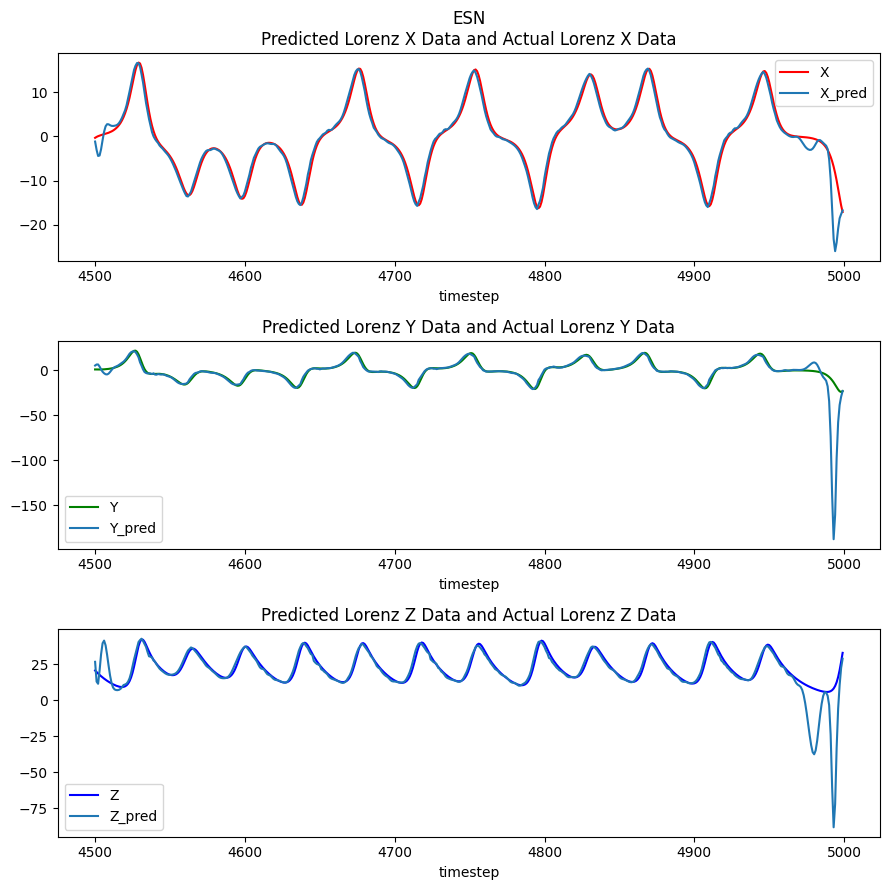

In [12]:
print("Echo State Network Forecast Horizons of X, Y, and Z: ", average_forecast_horizon(predicted_data, testing_data))

plot_graphs(testing_data, predicted_data, title='ESN')

### Novel Models

Fully Connected Graph Forecast Horizons of X, Y, and Z:  (0.94, 0.934, 0.96)


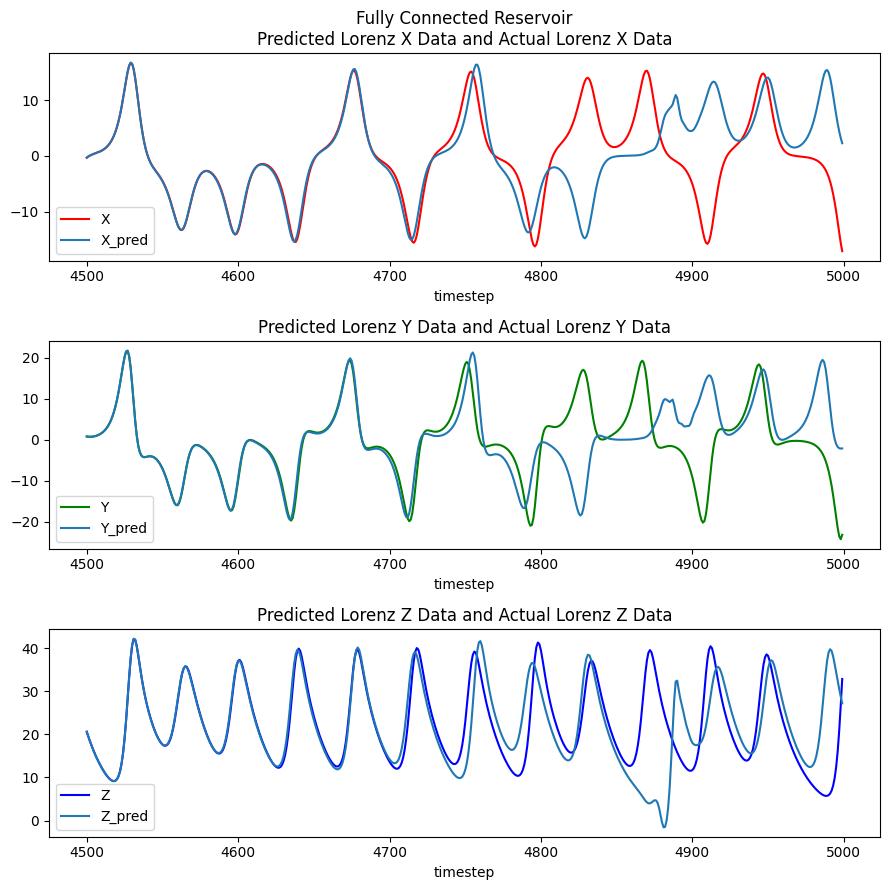

In [13]:
# Novel Fully Connected  Reservoir Graph

predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob, seed=52, graph_type='complete',
                            data=training_data, future_data=len(testing_data))

print("Fully Connected Graph Forecast Horizons of X, Y, and Z: ", average_forecast_horizon(predicted_data, testing_data))

plot_graphs(testing_data, predicted_data, title='Fully Connected Reservoir')

Powerlaw Degree Distribution Forecast Horizons of X, Y, and Z:  (0.946, 0.938, 0.95)


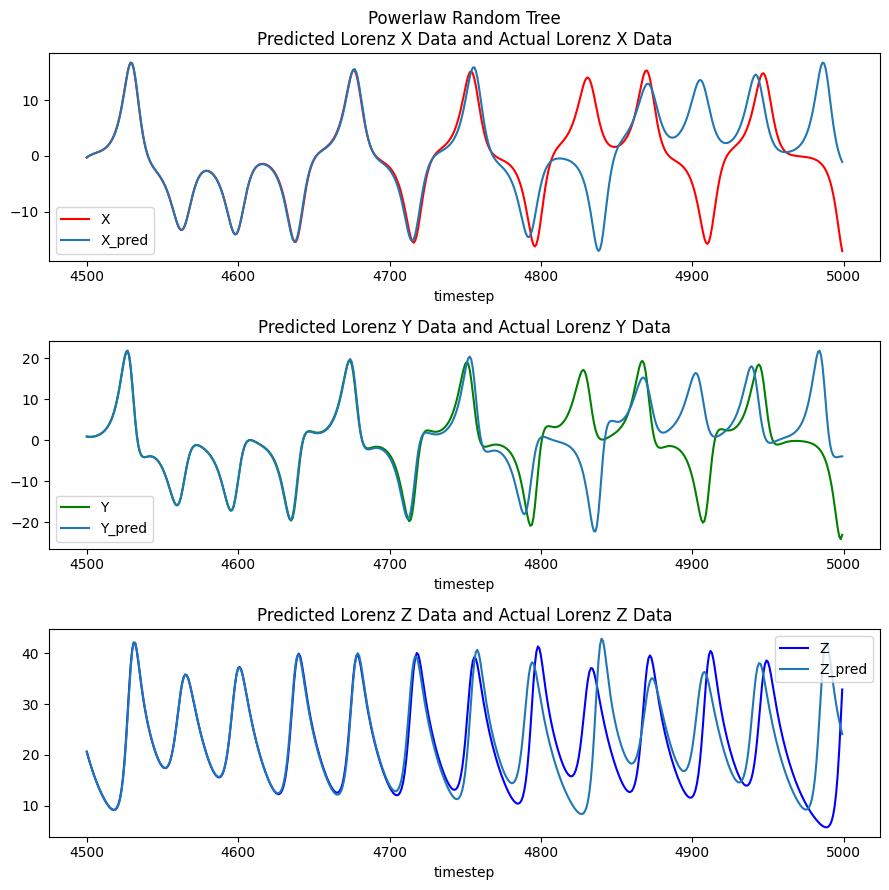

In [14]:
# Novel Tree with Powerlaw Degree Distribution Reservoir Structure

predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob, seed=52, graph_type='tree',
                            data=training_data, future_data=len(testing_data))

print("Powerlaw Degree Distribution Forecast Horizons of X, Y, and Z: ", average_forecast_horizon(predicted_data, testing_data))

plot_graphs(testing_data, predicted_data, 'Powerlaw Random Tree')

Random Edge Forecast Horizons of X, Y, and Z:  (0.954, 0.936, 0.952)


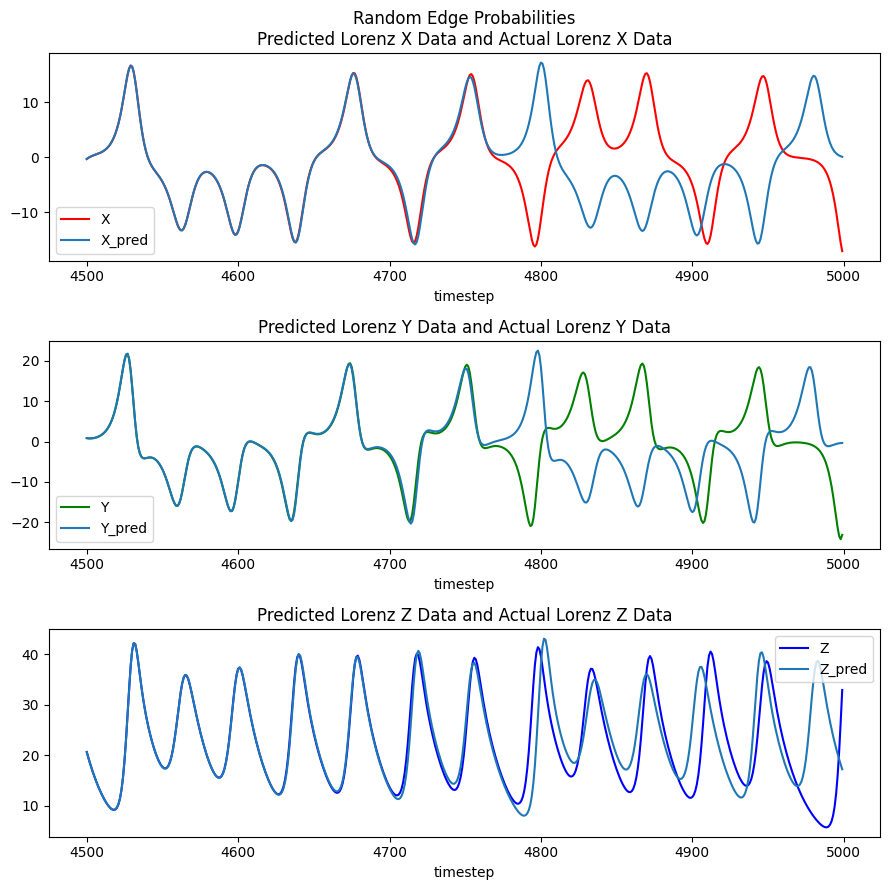

In [15]:
# Novel Random Edge Probabilitie

predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob,
                                         seed=52, random_edge_probability=True, data=training_data, future_data=len(testing_data))

print("Random Edge Forecast Horizons of X, Y, and Z: ", average_forecast_horizon(predicted_data, testing_data))

plot_graphs(testing_data, predicted_data, title='Random Edge Probabilities')

## Results Section

In [16]:
import time
from tabulate import tabulate

In [20]:
def getAccuracy(predicted_data, testing_data):
  return average_forecast_horizon(predicted_data, testing_data)

def makeAndSaveGraph(test, pred, title=None):
  fig, ax = plt.subplots(3, 1, figsize=(9, 9))

  t = [i for i in range(int(n_timesteps*train_test_split_ratio), n_timesteps)]
  temp = ['X', 'Y', 'Z']
  color_table = ['red', 'green', 'blue']
  if title:
    ax[0].set_title(title+'\n')
  for i in range(3):
    if i == 0:
      new_title = title + '\n' + "Predicted Lorenz " + temp[i] + " Data and Actual Lorenz " + temp[i] + " Data"
    else:
      new_title = "Predicted Lorenz " + temp[i] + " Data and Actual Lorenz " + temp[i] + " Data"
    ax[i].set_title(new_title)
    ax[i].set_xlabel("timestep")
    ax[i].plot(t, test[:, i], label=temp[i], color=color_table[i])
    ax[i].plot(t, pred[:, i], label=temp[i]+"_pred")
    ax[i].legend()

  fig.tight_layout()

  # plt.savefig(title + ".jpg")

Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 356it [00:00, 3555.00it/s]           
Running Model-0: 712it [00:00, 3372.43it/s]
Running Model-0: 1050it [00:00, 3258.98it/s]
Running Model-0: 1394it [00:00, 3327.25it/s]
Running Model-0: 1765it [00:00, 3461.66it/s]
Running Model-0: 2128it [00:00, 3517.29it/s]
Running Model-0: 2481it [00:00, 3420.56it/s]
Running Model-0: 2840it [00:00, 3472.34it/s]
Running Model-0: 3223it [00:00, 3581.20it/s]
Running Model-0: 3582it [00:01, 3523.07it/s]
Running Model-0: 3935it [00:01, 3433.57it/s]
Running Model-0: 4499it [00:01, 3303.20it/s]
Running Model-0: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


Fitting node Ridge-0...


Running Model-0: 500it [00:00, 3755.31it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 419it [00:00, 4189.21it/s]           
Running Model-0: 838it [00:00, 3901.93it/s]
Running Model-0: 1230it [00:00, 3801.06it/s]
Running Model-0: 1611it [00:00, 3642.26it/s]
Running Model-0: 1977it [00:00, 3484.50it/s]
Running Model-0: 2327it [00:00, 3485.94it/s]
Running Model-0: 2699it [00:00, 3556.82it/s]
Running Model-0: 3056it [00:00, 3555.03it/s]
Running Model-0: 3436it [00:00, 3627.88it/s]
Running Model-0: 3800it [00:01, 3512.47it/s]
Running Model-0: 4499it [00:01, 3617.94it/s]
Running Model-0: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


Fitting node Ridge-0...


Running Model-0: 500it [00:00, 3450.44it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 355it [00:00, 3544.68it/s]           
Running Model-0: 726it [00:00, 3639.89it/s]
Running Model-0: 1090it [00:00, 3305.73it/s]
Running Model-0: 1424it [00:00, 2950.90it/s]
Running Model-0: 1725it [00:00, 2802.13it/s]
Running Model-0: 2009it [00:00, 2608.65it/s]
Running Model-0: 2273it [00:00, 2599.40it/s]
Running Model-0: 2562it [00:00, 2681.52it/s]
Running Model-0: 2853it [00:01, 2747.40it/s]
Running Model-0: 3130it [00:01, 2722.23it/s]
Running Model-0: 3421it [00:01, 2775.04it/s]
Running Model-0: 3700it [00:01, 2671.53it/s]
Running Model-0: 3969it [00:01, 2607.92it/s]
Running Model-0: 4499it [00:01, 2756.70it/s]
Running Model-0: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


Fitting node Ridge-0...


Running Model-0: 500it [00:00, 2356.03it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 392it [00:00, 3911.79it/s]           
Running Model-0: 784it [00:00, 3654.70it/s]
Running Model-0: 1151it [00:00, 3555.81it/s]
Running Model-0: 1512it [00:00, 3572.58it/s]
Running Model-0: 1870it [00:00, 3572.07it/s]
Running Model-0: 2228it [00:00, 3539.26it/s]
Running Model-0: 2583it [00:00, 3126.83it/s]
Running Model-0: 2934it [00:00, 3236.28it/s]
Running Model-0: 3265it [00:00, 3248.12it/s]
Running Model-0: 3604it [00:01, 3287.56it/s]
Running Model-0: 4002it [00:01, 3491.08it/s]
Running Model-0: 4385it [00:01, 3591.43it/s]
Running Model-0: 4753it [00:01, 3616.27it/s]
Running Model-0: 5131it [00:01, 3663.63it/s]
Running Model-0: 5511it [00:01, 3700.08it/s]
Running Model-0: 5882it [00:01, 2549.89it/s]
Running Model-0: 6186it [00:02, 1756.94it/s]
Running Model-0: 6483it [00:02, 1970.89it/s]
Running Model-0: 6847it [00:02, 2306.73it/s]
Running Model-0: 7229it [00:02, 2644.

Fitting node Ridge-0...


Running Model-0: 1000it [00:00, 4132.50it/s]
<ipython-input-20-904c55bbb443>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(3, 1, figsize=(9, 9))
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 342it [00:00, 3415.00it/s]           
Running Model-0: 703it [00:00, 3524.73it/s]
Running Model-0: 1056it [00:00, 3331.15it/s]
Running Model-0: 1435it [00:00, 3503.31it/s]
Running Model-0: 1787it [00:00, 3463.21it/s]
Running Model-0: 2141it [00:00, 3487.00it/s]
Running Model-0: 2526it [00:00, 3601.20it/s]
Running Model-0: 2901it [00:00, 3645.39it/s]
Running Model-0: 3266it [00:00, 3602.87it/s]
Running Model-0: 3627it [00:01, 3527.33it/s]
Running Model-0: 3981it [00:01, 3177.21it/s]
R

Fitting node Ridge-0...


Running Model-0: 1000it [00:00, 3384.51it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 385it [00:00, 3848.91it/s]           
Running Model-0: 770it [00:00, 3796.52it/s]
Running Model-0: 1150it [00:00, 3503.20it/s]
Running Model-0: 1528it [00:00, 3603.91it/s]
Running Model-0: 1891it [00:00, 3591.61it/s]
Running Model-0: 2259it [00:00, 3619.95it/s]
Running Model-0: 2632it [00:00, 3653.54it/s]
Running Model-0: 3008it [00:00, 3685.48it/s]
Running Model-0: 3378it [00:00, 3342.07it/s]
Running Model-0: 3719it [00:01, 3167.23it/s]
Running Model-0: 4091it [00:01, 3319.62it/s]
Running Model-0: 4429it [00:01, 3313.16it/s]
Running Model-0: 4764it [00:01, 3320.60it/s]
Running Model-0: 5146it [00:01, 3465.15it/s]
Running Model-0: 5520it [00:01, 3544.71it/s]
Running Model-0: 5910it [00:01, 3648.15it/s]
Running Model-0: 6277it [00:01, 3615.03it/s]
Running Model-0: 6640it [00:01, 3428.56it/s]
Running Model-0: 6986it [00:02, 3147.59it/s]
Running Model-0: 7339it [00:02, 3251

Fitting node Ridge-0...


Running Model-0: 1000it [00:00, 3793.58it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 413it [00:00, 4127.20it/s]           
Running Model-0: 826it [00:00, 3783.15it/s]
Running Model-0: 1207it [00:00, 3348.44it/s]
Running Model-0: 1547it [00:00, 3194.47it/s]
Running Model-0: 1899it [00:00, 3297.85it/s]
Running Model-0: 2264it [00:00, 3406.84it/s]
Running Model-0: 2608it [00:00, 3372.11it/s]
Running Model-0: 2972it [00:00, 3452.43it/s]
Running Model-0: 3319it [00:00, 3405.44it/s]
Running Model-0: 3670it [00:01, 3434.20it/s]
Running Model-0: 4021it [00:01, 3455.85it/s]
Running Model-0: 4368it [00:01, 3451.56it/s]
Running Model-0: 4714it [00:01, 2927.27it/s]
Running Model-0: 5021it [00:01, 2892.53it/s]
Running Model-0: 5371it [00:01, 3055.46it/s]
Running Model-0: 5698it [00:01, 3114.81it/s]
Running Model-0: 6040it [00:01, 3200.05it/s]
Running Model-0: 6422it [00:01, 3378.85it/s]
Running Model-0: 6777it [00:02, 3427.24it/s]
Running Model-0: 7129it [00:02, 3453

Fitting node Ridge-0...


Running Model-0: 1500it [00:00, 2547.01it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 344it [00:00, 3434.97it/s]           
Running Model-0: 692it [00:00, 3460.24it/s]
Running Model-0: 1039it [00:00, 3461.81it/s]
Running Model-0: 1386it [00:00, 3435.47it/s]
Running Model-0: 1760it [00:00, 3543.62it/s]
Running Model-0: 2115it [00:00, 3495.83it/s]
Running Model-0: 2465it [00:00, 3442.01it/s]
Running Model-0: 2824it [00:00, 3487.69it/s]
Running Model-0: 3174it [00:00, 3251.02it/s]
Running Model-0: 3503it [00:01, 2709.91it/s]
Running Model-0: 3790it [00:01, 2558.64it/s]
Running Model-0: 4057it [00:01, 2526.40it/s]
Running Model-0: 4317it [00:01, 2542.39it/s]
Running Model-0: 4578it [00:01, 2555.51it/s]
Running Model-0: 4884it [00:01, 2696.30it/s]
Running Model-0: 5158it [00:01, 2615.60it/s]
Running Model-0: 5423it [00:01, 2593.88it/s]
Running Model-0: 5688it [00:01, 2608.16it/s]
Running Model-0: 5951it [00:02, 2608.34it/s]
Running Model-0: 6213it [00:02, 2522

Fitting node Ridge-0...


Running Model-0: 1500it [00:00, 3701.11it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 384it [00:00, 3832.77it/s]           
Running Model-0: 768it [00:00, 3690.29it/s]
Running Model-0: 1138it [00:00, 3505.10it/s]
Running Model-0: 1496it [00:00, 3533.15it/s]
Running Model-0: 1851it [00:00, 3367.68it/s]
Running Model-0: 2190it [00:00, 3372.10it/s]
Running Model-0: 2549it [00:00, 3438.36it/s]
Running Model-0: 2894it [00:00, 3383.15it/s]
Running Model-0: 3233it [00:00, 3080.59it/s]
Running Model-0: 3569it [00:01, 3159.27it/s]
Running Model-0: 3917it [00:01, 3250.71it/s]
Running Model-0: 4265it [00:01, 3316.39it/s]
Running Model-0: 4623it [00:01, 3392.81it/s]
Running Model-0: 4979it [00:01, 3442.06it/s]
Running Model-0: 5325it [00:01, 3410.40it/s]
Running Model-0: 5691it [00:01, 3481.99it/s]
Running Model-0: 6067it [00:01, 3562.81it/s]
Running Model-0: 6425it [00:01, 3267.84it/s]
Running Model-0: 6757it [00:02, 3175.89it/s]
Running Model-0: 7113it [00:02, 3282

Fitting node Ridge-0...


Running Model-0: 1500it [00:00, 3771.29it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 384it [00:00, 3833.21it/s]           
Running Model-0: 768it [00:00, 3218.08it/s]
Running Model-0: 1097it [00:00, 3229.82it/s]
Running Model-0: 1432it [00:00, 3272.57it/s]
Running Model-0: 1779it [00:00, 3340.61it/s]
Running Model-0: 2115it [00:00, 3042.66it/s]
Running Model-0: 2456it [00:00, 3152.67it/s]
Running Model-0: 2800it [00:00, 3238.49it/s]
Running Model-0: 3153it [00:00, 3324.07it/s]
Running Model-0: 3508it [00:01, 3390.48it/s]
Running Model-0: 3850it [00:01, 3225.36it/s]
Running Model-0: 4176it [00:01, 2979.66it/s]
Running Model-0: 4479it [00:01, 2990.81it/s]
Running Model-0: 4816it [00:01, 3096.83it/s]
Running Model-0: 5129it [00:01, 2687.41it/s]
Running Model-0: 5409it [00:01, 2655.62it/s]
Running Model-0: 5682it [00:01, 2648.60it/s]
Running Model-0: 5952it [00:01, 2639.98it/s]
Running Model-0: 6220it [00:02, 2469.72it/s]
Running Model-0: 6471it [00:02, 2303

Fitting node Ridge-0...


Running Model-0: 2000it [00:00, 2543.81it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 342it [00:00, 3413.94it/s]           
Running Model-0: 694it [00:00, 3474.78it/s]
Running Model-0: 1045it [00:00, 3487.04it/s]
Running Model-0: 1394it [00:00, 3283.59it/s]
Running Model-0: 1745it [00:00, 3361.42it/s]
Running Model-0: 2083it [00:00, 3249.71it/s]
Running Model-0: 2426it [00:00, 3304.41it/s]
Running Model-0: 2798it [00:00, 3431.04it/s]
Running Model-0: 3143it [00:00, 3432.46it/s]
Running Model-0: 3488it [00:01, 3081.97it/s]
Running Model-0: 3804it [00:01, 2899.08it/s]
Running Model-0: 4140it [00:01, 3023.96it/s]
Running Model-0: 4448it [00:01, 2966.38it/s]
Running Model-0: 4792it [00:01, 3098.31it/s]
Running Model-0: 5152it [00:01, 3239.71it/s]
Running Model-0: 5530it [00:01, 3396.36it/s]
Running Model-0: 5899it [00:01, 3479.82it/s]
Running Model-0: 6250it [00:01, 3359.33it/s]
Running Model-0: 6589it [00:02, 3127.31it/s]
Running Model-0: 6907it [00:02, 3060

Fitting node Ridge-0...


Running Model-0: 2000it [00:00, 2727.46it/s]
Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 404it [00:00, 4033.39it/s]           
Running Model-0: 808it [00:00, 3487.81it/s]
Running Model-0: 1162it [00:00, 3447.52it/s]
Running Model-0: 1513it [00:00, 3468.91it/s]
Running Model-0: 1893it [00:00, 3580.90it/s]
Running Model-0: 2253it [00:00, 3583.13it/s]
Running Model-0: 2613it [00:00, 3525.60it/s]
Running Model-0: 2967it [00:00, 3232.47it/s]
Running Model-0: 3295it [00:00, 3047.33it/s]
Running Model-0: 3646it [00:01, 3174.89it/s]
Running Model-0: 3968it [00:01, 3137.56it/s]
Running Model-0: 4329it [00:01, 3271.82it/s]
Running Model-0: 4698it [00:01, 3392.61it/s]
Running Model-0: 5067it [00:01, 3477.51it/s]
Running Model-0: 5431it [00:01, 3524.94it/s]
Running Model-0: 5785it [00:01, 3491.36it/s]
Running Model-0: 6136it [00:01, 3405.78it/s]
Running Model-0: 6478it [00:01, 3189.73it/s]
Running Model-0: 6820it [00:02, 3254.07it/s]
Running Model-0: 7201it [00:02, 3410

Fitting node Ridge-0...


Running Model-0: 2000it [00:00, 3881.98it/s]


╒════╤═══════════════════════════╤════════╤═════════════╤══════════════════════════════════════════════════════════════╕
│    │ Model                     │   Seed │   Timesteps │ Forecast Horizon                                             │
╞════╪═══════════════════════════╪════════╪═════════════╪══════════════════════════════════════════════════════════════╡
│  0 │ Normal Reservoir          │     50 │        5000 │ (0.974, 0.938, 0.83)                                         │
├────┼───────────────────────────┼────────┼─────────────┼──────────────────────────────────────────────────────────────┤
│  1 │ ESN                       │     50 │        5000 │ (1.0, 1.0, 0.99)                                             │
├────┼───────────────────────────┼────────┼─────────────┼──────────────────────────────────────────────────────────────┤
│  2 │ Complete Reservoir        │     50 │        5000 │ (0.938, 0.938, 0.974)                                        │
├────┼──────────────────────────

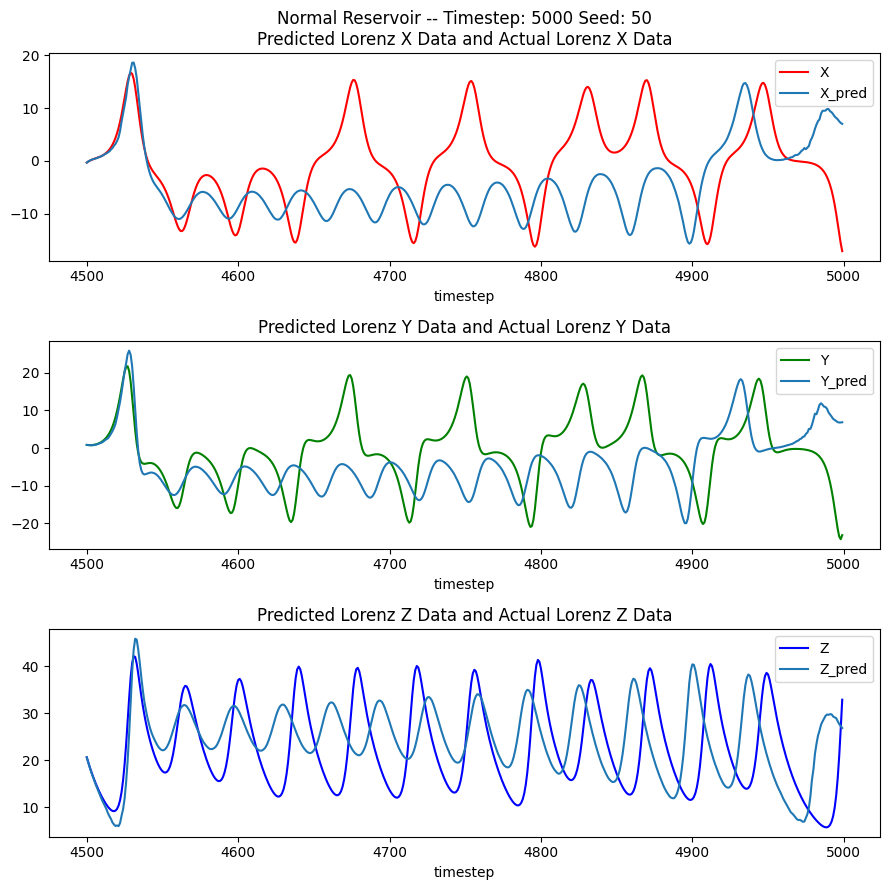

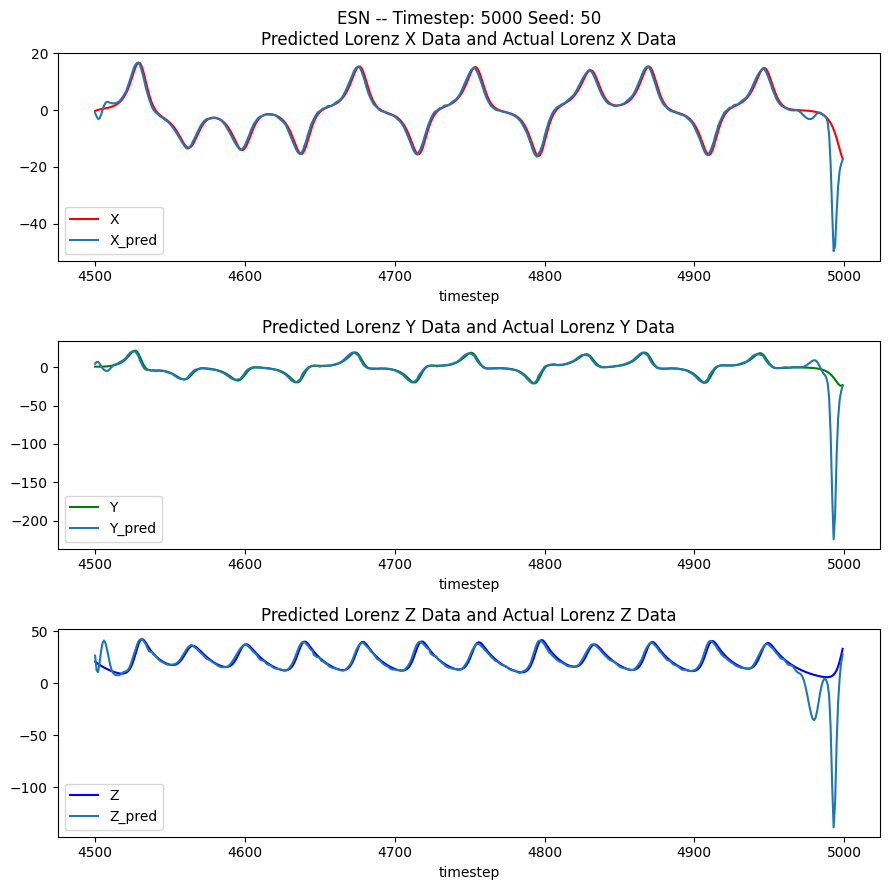

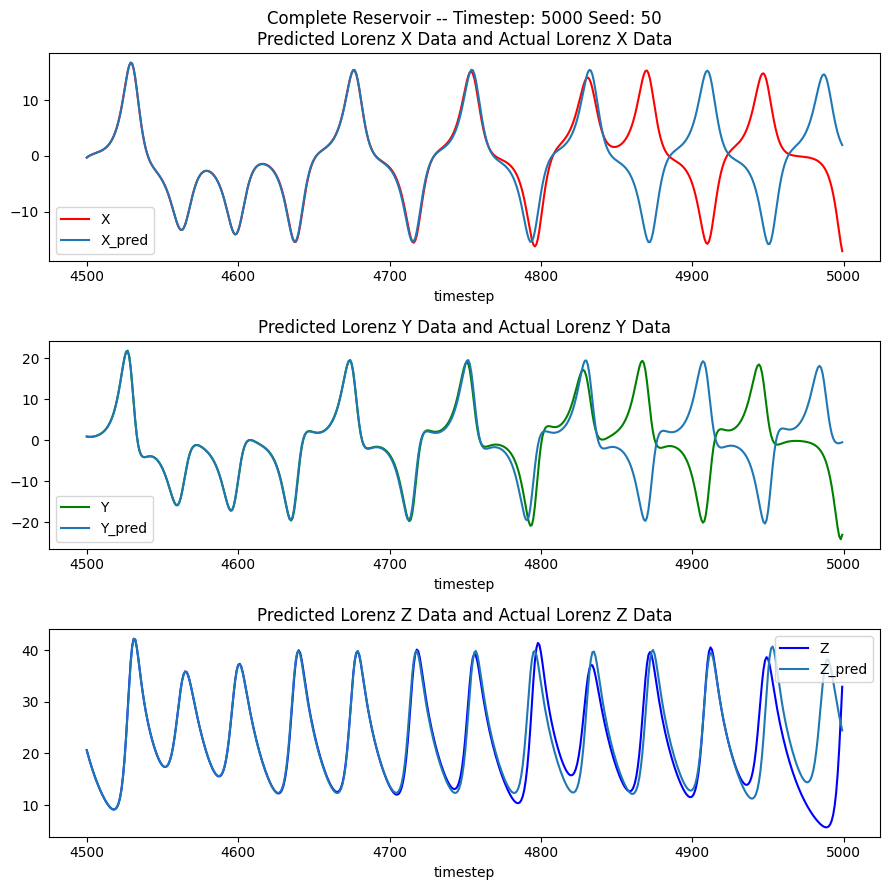

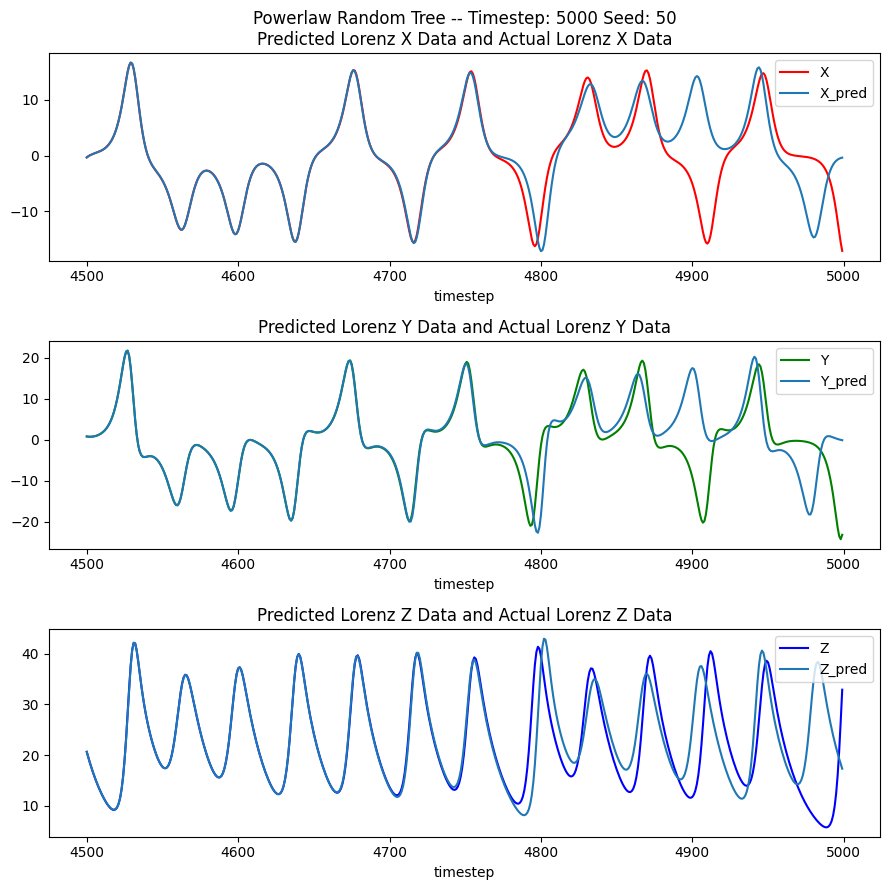

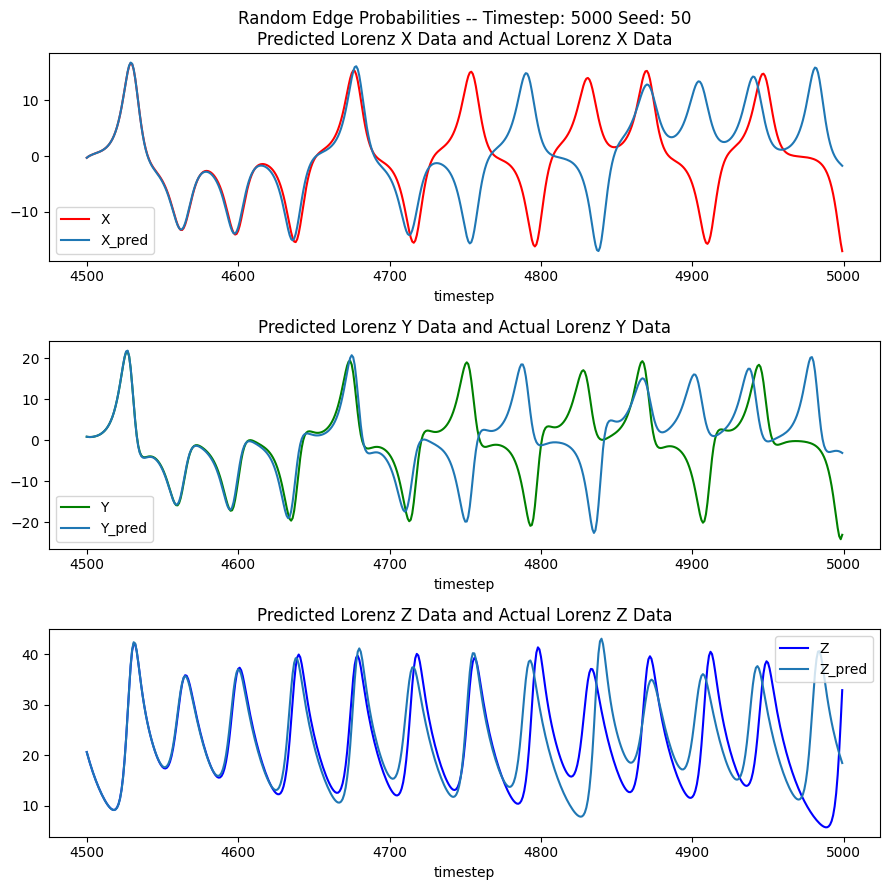

...

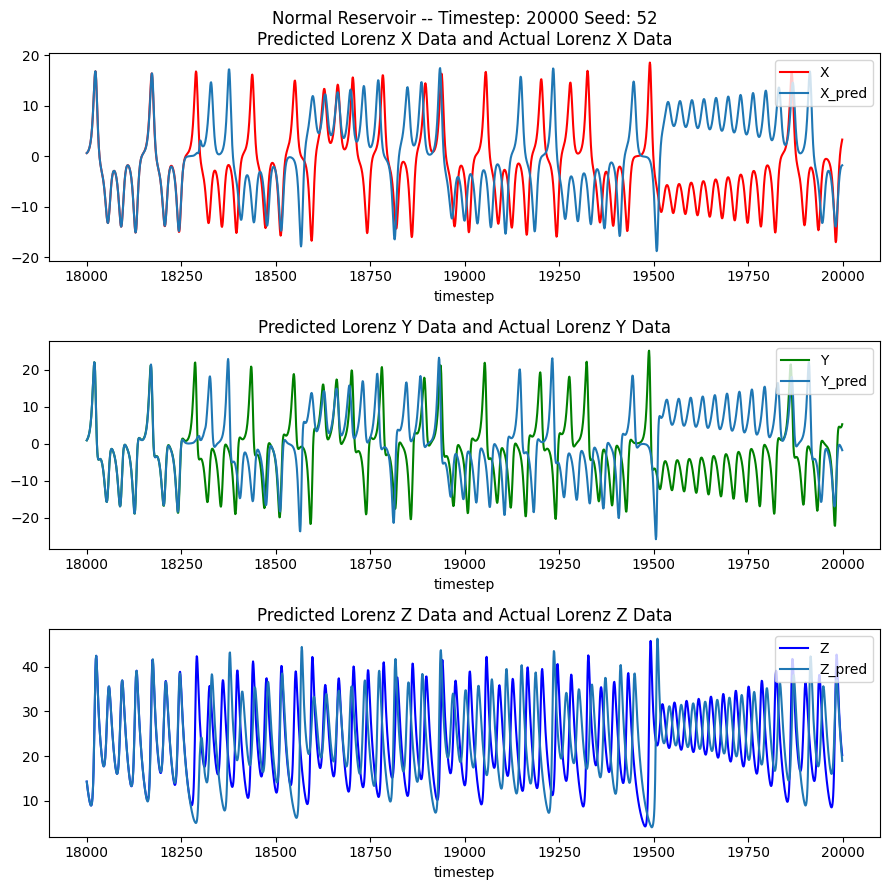

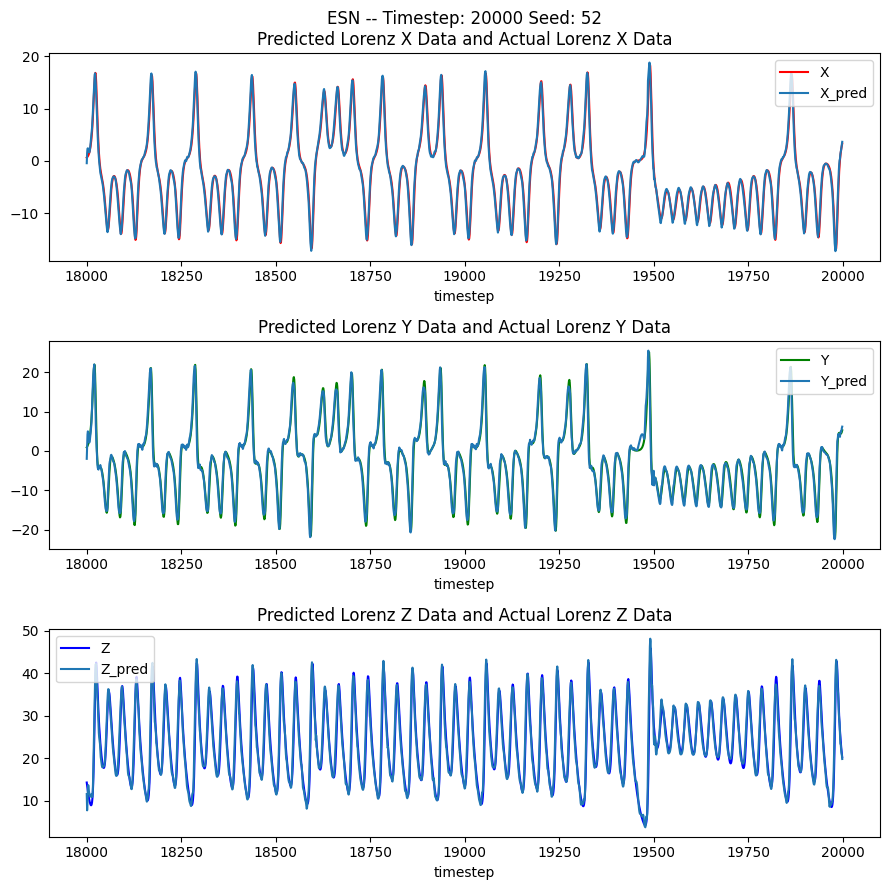

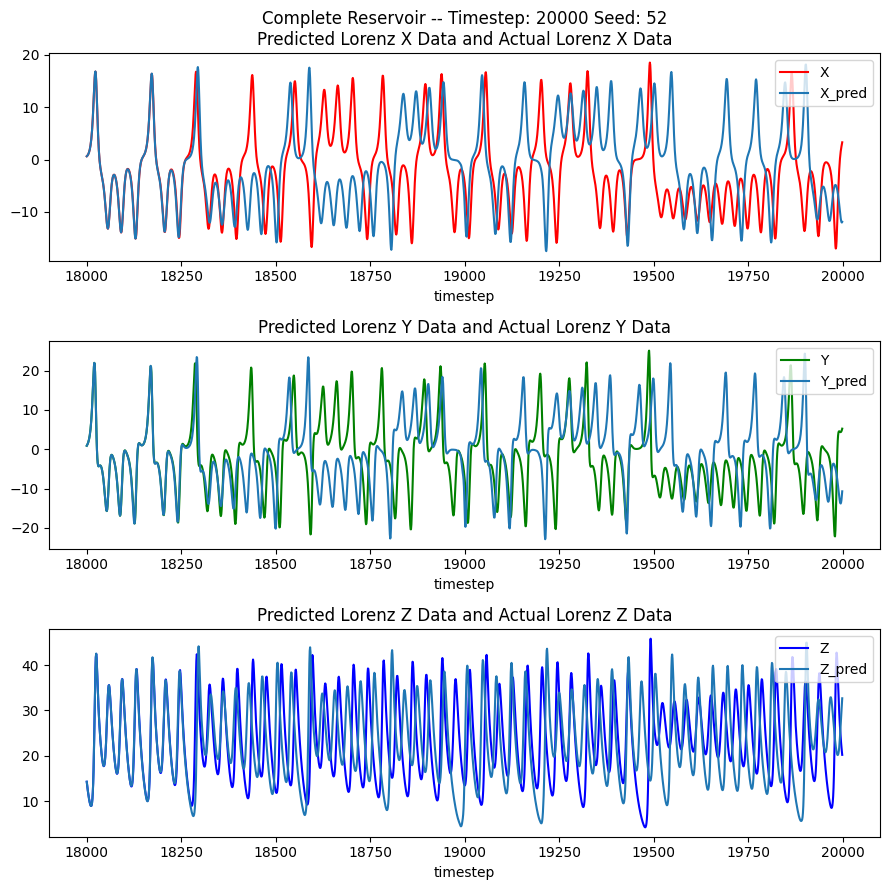

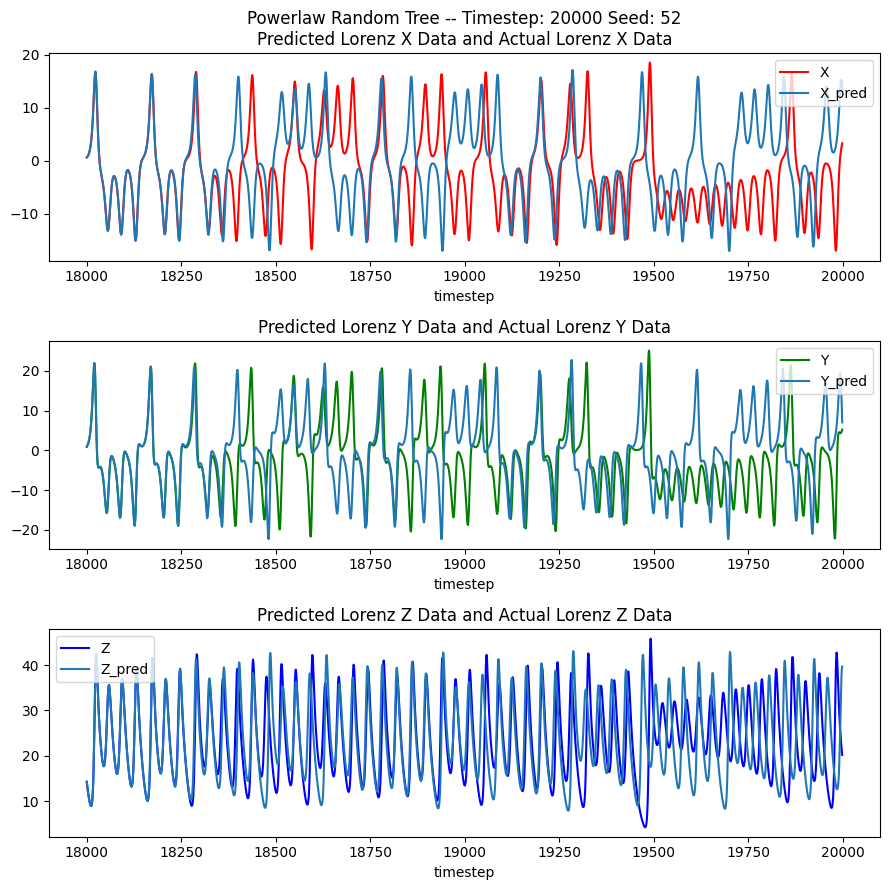

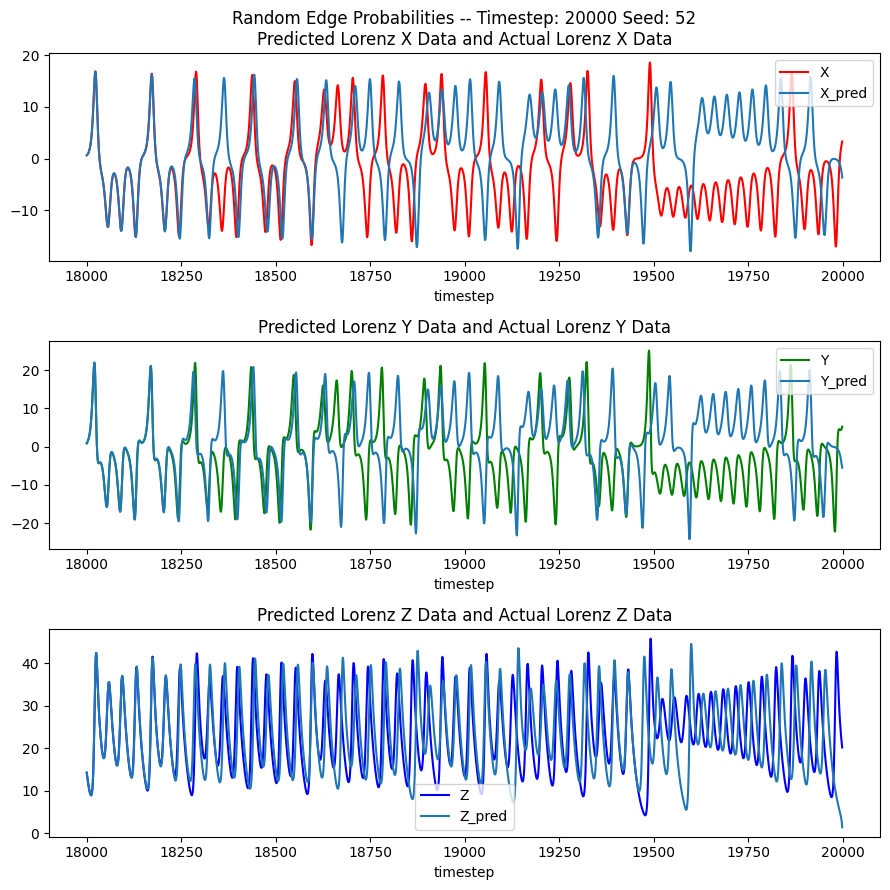

In [21]:
col_names1 = ["Model", "Seed", "Timesteps", "Forecast Horizon"]
col_names2 = ["Model", "Seed", "Timesteps", "Time"]
col_names3 = ["Timesteps","Model","Avg FH X","Avg FH Y","Avg FH Z","Average Time"]

data1 = []
data2 = []
data3 = []

accuracy = {}  # To access accuracy, do accuracy[timestep (numerical format.. 5000, 10000, 15000, 20000)][seed number (numerical format.. 50, 51, or 52)][model number (numerical format.. 0 for model 1, 1 for model 2, vice versa)]
times = {}

for n_timesteps in range(5000, 20001, 5000):

  data, training_data, testing_data = dataset(n_timesteps)

  accuracy[n_timesteps] = {}
  times[n_timesteps] = {}

  for seed in range(50, 53):
    # Model 1
    s = time.time()
    predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob,
                                         seed=seed, data=training_data, future_data=len(testing_data))
    e = time.time()
    time1 = e - s
    accuracy1 = getAccuracy(predicted_data, testing_data)
    makeAndSaveGraph(testing_data, predicted_data, title = "Normal Reservoir -- Timestep: " + str(n_timesteps) + " Seed: " + str(seed))

    data1 += [["Normal Reservoir", str(seed), str(n_timesteps), str(accuracy1)]]
    data2 += [["Normal Reservoir", str(seed), str(n_timesteps), str(time1)]]

    # Model 2
    X_train = training_data[:-1]
    X_test = training_data[1:] + [[0, 0, 0]]
    s = time.time()
    esn_model = esn_model.fit(X_train, X_test)
    e = time.time()
    time2 = e - s
    predicted_data = esn_model.run(testing_data)
    accuracy2 = getAccuracy(predicted_data, testing_data)
    makeAndSaveGraph(testing_data, predicted_data, title = "ESN -- Timestep: " + str(n_timesteps) + " Seed: " + str(seed))

    data1 += [["ESN", str(seed), str(n_timesteps), str(accuracy2)]]
    data2 += [["ESN", str(seed), str(n_timesteps), str(time2)]]

    # Model 3
    s = time.time()
    predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob, seed=seed,
                                         graph_type='complete', data=training_data, future_data=len(testing_data))
    e = time.time()
    time3 = e - s
    accuracy3 = getAccuracy(predicted_data, testing_data)
    makeAndSaveGraph(testing_data, predicted_data, title = "Complete Reservoir -- Timestep: " + str(n_timesteps) + " Seed: " + str(seed))

    data1 += [["Complete Reservoir", str(seed), str(n_timesteps), str(accuracy3)]]
    data2 += [["Complete Reservoir", str(seed), str(n_timesteps), str(time3)]]

    # Model 4
    s = time.time()
    predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob, seed=seed,
                                         graph_type='tree', data=training_data, future_data=len(testing_data))
    e = time.time()
    time4 = e - s
    accuracy4 = getAccuracy(predicted_data, testing_data)
    makeAndSaveGraph(testing_data, predicted_data, title = "Powerlaw Random Tree -- Timestep: " + str(n_timesteps) + " Seed: " + str(seed))

    data1 += [["Powerlaw Random Tree", str(seed), str(n_timesteps), str(accuracy4)]]
    data2 += [["Powerlaw Random Tree", str(seed), str(n_timesteps), str(time4)]]

    # Model 5
    s = time.time()
    predicted_data = create_fit_forecast(number_of_features, reservoir_dim, spectral_radius, edge_creation_prob, seed=seed,
                                         random_edge_probability=True, data=training_data, future_data=len(testing_data))
    e = time.time()
    time5 = e - s
    accuracy5 = getAccuracy(predicted_data, testing_data)
    makeAndSaveGraph(testing_data, predicted_data, title = "Random Edge Probabilities -- Timestep: " + str(n_timesteps) + " Seed: " + str(seed))

    data1 += [["Random Edge Probabilities", str(seed), str(n_timesteps), str(accuracy3)]]
    data2 += [["Random Edge Probabilities", str(seed), str(n_timesteps), str(time5)]]

    accuracies = [accuracy1, accuracy2, accuracy3, accuracy4, accuracy5]
    accuracy[n_timesteps][seed] = accuracies
    times[n_timesteps][seed] = [time1, time2, time3, time4, time5]

  for model in range(0,5):

    accX, accY, accZ, t = 0,0,0,0

    for i in range(50,53):

      acc, x = accuracy[n_timesteps][i][model], times[n_timesteps][i][model]

      accX+=acc[0]
      accY+=acc[1]
      accZ+=acc[2]
      t+=x

    data3 += [[str(n_timesteps), str(model), str(accX/3), str(accY/3), str(accZ/3), str(t/3)]]

print(tabulate(data1, headers=col_names1, tablefmt="fancy_grid", showindex="always"))
print(tabulate(data2, headers=col_names2, tablefmt="fancy_grid", showindex="always"))
print(tabulate(data3, headers=col_names3, tablefmt="fancy_grid", showindex="always"))
